# Brain MRI Classification

We do Brain MRI Classification using 3 differenct base models with transfer learning:
* ResNet v2
* VGG16
* Xception

Finally, we will display the activation maps using Grad-Cam.

Enjoy the notebook and feedback greatly appreciated.

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# You should use mixed precision if you use TPUs or NVIDIA GPUs with at least compute capability 7.0, as it will improve performance by up to 3x.
# With this policy, layers use float16 computations and float32 variables. Computations are done in float16 for performance, but variables must be kept in float32 for numeric stability.
# IMPORTANT : A softmax activation at the end of the model should be float32.
# from tensorflow.keras import mixed_precision
# mixed_precision.set_global_policy('mixed_float16')

# Overall Settings

In [2]:
FINE_TUNING_EPOCHS = 7
TRAINING_EPOCHS = 3
BATCH_SIZE = 32

image_height = 299
image_width = 299

# Load data

In [3]:
import glob

# Make objects with the images and masks. 
brain_scans = []
mask_files = glob.glob('kaggle_3m/*/*_mask*')

for i in mask_files:
    brain_scans.append(i.replace('_mask',''))

In [4]:
# Make a dataframe with the images and their corresponding masks
data_df = pd.DataFrame({"image_path":brain_scans, "mask_path":mask_files})

In [5]:
import cv2
# Make a function that search for the largest pixel value in the masks, because that will indicate if the image have 
# a corresponding mask with a tumor or not. 
def positive_negative_diagnosis(file_masks):
    mask = cv2.imread(file_masks)
    value = np.max(mask)
    if value > 0:
        return 'Positive'
    else:
        return 'Negative'

In [6]:
# Apply the function to the masks and return back a column with 1 and zeros, where 0 indicate no tumor and 1 a tumor. 
data_df["tumour"] = data_df["mask_path"].apply(lambda x: positive_negative_diagnosis(x)) 

In [7]:
# Create the data sets
from sklearn.model_selection import train_test_split

train_df, test_df  = train_test_split(data_df, test_size = 0.1, stratify = data_df['tumour'] )
train_df, valid_df = train_test_split(train_df,test_size = 0.2, stratify = train_df['tumour'])

# Data Generators

In [8]:
# deep learning libraries
import tensorflow as tf
import keras
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import applications
from keras.models import Sequential, load_model
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Flatten, Dense, Dropout
from keras.preprocessing import image
from tensorflow.keras.utils import image_dataset_from_directory
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

In [9]:
train_df

,image_path,mask_path,tumour
1294,kaggle_3m\TCGA_DU_7014_19860618\TCGA_DU_7014_1...,kaggle_3m\TCGA_DU_7014_19860618\TCGA_DU_7014_1...,Negative
2710,kaggle_3m\TCGA_FG_8189_20030516\TCGA_FG_8189_2...,kaggle_3m\TCGA_FG_8189_20030516\TCGA_FG_8189_2...,Negative
2730,kaggle_3m\TCGA_FG_8189_20030516\TCGA_FG_8189_2...,kaggle_3m\TCGA_FG_8189_20030516\TCGA_FG_8189_2...,Negative
803,kaggle_3m\TCGA_DU_6400_19830518\TCGA_DU_6400_1...,kaggle_3m\TCGA_DU_6400_19830518\TCGA_DU_6400_1...,Negative
104,kaggle_3m\TCGA_CS_5395_19981004\TCGA_CS_5395_1...,kaggle_3m\TCGA_CS_5395_19981004\TCGA_CS_5395_1...,Negative
...,...,...,...
142,kaggle_3m\TCGA_CS_5396_20010302\TCGA_CS_5396_2...,kaggle_3m\TCGA_CS_5396_20010302\TCGA_CS_5396_2...,Negative
2733,kaggle_3m\TCGA_FG_8189_20030516\TCGA_FG_8189_2...,kaggle_3m\TCGA_FG_8189_20030516\TCGA_FG_8189_2...,Negative
2989,kaggle_3m\TCGA_HT_7605_19950916\TCGA_HT_7605_1...,kaggle_3m\TCGA_HT_7605_19950916\TCGA_HT_7605_1...,Negative
2022,kaggle_3m\TCGA_DU_A5TR_19970726\TCGA_DU_A5TR_1...,kaggle_3m\TCGA_DU_A5TR_19970726\TCGA_DU_A5TR_1...,Positive


In [10]:
# Data agumentation and pre-processing using tensorflow
gen = ImageDataGenerator(rescale         = 1./255.,
                         horizontal_flip = True,
                         vertical_flip   = True,
                         zoom_range      = 0.05,
                         rotation_range  = 25)
 
train_generator = gen.flow_from_dataframe(
    train_df, # dataframe
    directory   = '', # images data path / folder in which images are there
    x_col       = 'image_path',
    y_col       = 'tumour',
    color_mode  = "rgb",
    target_size = (image_height, image_width), # image height , image width
    class_mode  = "categorical",
    batch_size  = BATCH_SIZE,
    shuffle = True,
    seed = 42)

Found 2828 validated image filenames belonging to 2 classes.


In [11]:
# Data agumentation and pre-processing using tensorflow
test_gen = ImageDataGenerator(rescale = 1./255.)

validation_generator = test_gen.flow_from_dataframe(
    valid_df, # dataframe
    directory   = '', # images data path / folder in which images are there
    x_col       = 'image_path',
    y_col       = 'tumour',
    color_mode  = "rgb",
    target_size = (image_height, image_width), # image height , image width
    class_mode  = "categorical",
    batch_size  = BATCH_SIZE,
    shuffle     = True,
    seed        = 42)

test_generator = test_gen.flow_from_dataframe(
    test_df, # dataframe
    directory   = '', # images data path / folder in which images are there
    x_col       = 'image_path',
    y_col       = 'tumour',
    color_mode  = "rgb",
    target_size = (image_height, image_width), # image height , image width
    class_mode  = "categorical",
    batch_size  = BATCH_SIZE,
    shuffle     = False)

Found 708 validated image filenames belonging to 2 classes.
Found 393 validated image filenames belonging to 2 classes.


In [12]:
# Get labels in dataset
a = train_generator.class_indices
class_names = list(a.keys())  # storing class/breed names in a list

In [13]:
class_names

['Negative', 'Positive']

In [14]:
train_freq      = np.unique(train_generator.classes, return_counts=True)
validation_freq = np.unique(validation_generator.classes, return_counts=True)
test_freq       = np.unique(test_generator.classes, return_counts=True)

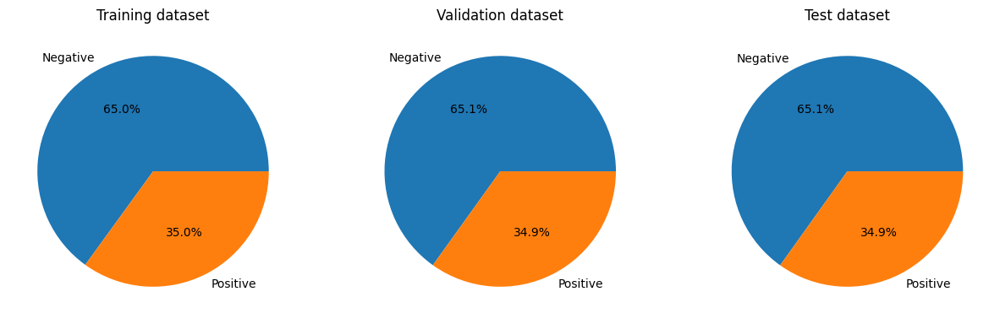

In [15]:
fig, ax = plt.subplots(1,3,figsize = (15,5))
ax[0].set_title("Training dataset")
ax[0].pie(train_freq[1], labels = class_names, autopct='%1.1f%%');
ax[1].set_title("Validation dataset")
ax[1].pie(validation_freq[1], labels = class_names, autopct='%1.1f%%');
ax[2].set_title("Test dataset")
ax[2].pie(test_freq[1], labels = class_names, autopct='%1.1f%%');

In [16]:
# clearly an umbalanced data set so let's some class weights
from sklearn.utils.class_weight import compute_class_weight
class_weights = compute_class_weight(class_weight = "balanced", classes= np.unique(train_generator.classes), y= train_generator.classes)
class_weights = dict(zip(np.unique(train_generator.classes), class_weights))

In [17]:
class_weights

{0: 0.7688961392060902, 1: 1.4297269969666329}

In [18]:
def plot_images(img, true_labels, predictions = None):
    plt.figure(figsize=[12, 18])
    for i in range(24):
        plt.subplot(6, 4, i+1)
        plt.imshow(img[i])
        plt.axis('off')
        if (predictions is not None):
            plt.title("{}\n {} {:.1f}%".format(class_names[np.argmax(true_labels[i])], class_names[np.argmax(predictions[i])], 100 * np.max(predictions[i])))
        else:
            plt.title(class_names[np.argmax(true_labels[i])])    

# Sample Images

In [19]:
x,y = next(train_generator)
plot_images(x,y)

In [ ]:
# function to plote training history
def plot_history(history):
    # store results
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    # plot results
    # accuracy
    plt.figure(figsize=(5, 8))
    plt.rcParams['figure.figsize'] = [8, 4]
    plt.rcParams['font.size'] = 10
    plt.rcParams['axes.grid'] = True
    plt.rcParams['figure.facecolor'] = 'white'
    plt.subplot(2, 1, 1)
    plt.plot(acc, label='Training Accuracy')
    plt.plot(val_acc, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.ylabel('Accuracy')
    plt.title(f'\nTraining and Validation Accuracy. \nTrain Accuracy: {str(round(acc[-1],3))}\nValidation Accuracy: {str(round(val_acc[-1],3))}')
    
    # loss
    plt.subplot(2, 1, 2)
    plt.plot(loss, label='Training Loss')
    plt.plot(val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.ylabel('Cross Entropy')
    plt.title(f'Training and Validation Loss. \nTrain Loss: {str(round(loss[-1],3))}\nValidation Loss: {str(round(val_loss[-1],3))}')
    plt.xlabel('epoch')
    plt.tight_layout(pad=3.0)
    plt.show()

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

def plot_heatmap(y_true, y_pred, class_names, ax, title):
    cm = confusion_matrix(y_true, y_pred)
    
    sensitivity = cm[1,1]/(cm[1,0]+cm[1,1])
    specificity = cm[0,0]/(cm[0,0]+cm[0,1])
    
    new_title = f'{title}\n Sensitivity = {sensitivity:.2f} Specificity = {specificity:.2f}'
    
    sns.heatmap(
        cm, 
        annot=True, 
        square=True, 
        xticklabels=class_names, 
        yticklabels=class_names,
        fmt='d', 
        cmap=plt.cm.Blues,
        cbar=False,
        ax=ax)
    
    ax.set_title(new_title, fontsize = 12)
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 45, ha = "right")
    ax.set_ylabel('True Label', fontsize= 10)
    ax.set_xlabel('Predicted Label', fontsize = 10)

# Grad-Cam

In [ ]:
from matplotlib import cm

def make_gradcam_heatmap(image, model, last_conv_layer_name):
 
    img_array = tf.expand_dims(image, axis=0)
    
    # Remove last layer's softmax
    last_layer_activation = model.layers[-1].activation
    model.layers[-1].activation = None

    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    heatmap = heatmap.numpy()  
    
    
     # We rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # We use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # We use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # We create an image with RGB colorized heatmap
    jet_heatmap = tf.keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img_array[0].shape[1], img_array[0].shape[0]))
    jet_heatmap = tf.keras.utils.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * 0.4 + img_array[0] * 255 

    superimposed_img = tf.keras.utils.array_to_img(superimposed_img)
    
    # Restore last layer activation
    model.layers[-1].activation = last_layer_activation
    
    return superimposed_img

# Model

In [ ]:
from tensorflow.keras.models import Model

def create_model(base_model):
    
    x = base_model.output    
    x = GlobalAveragePooling2D()(x)
    x = Dense(128, activation = 'relu')(x)
    x = Dropout(0.4)(x)
    x = Dense(64, activation = 'relu')(x)
    x = Dropout(0.2)(x)
    
    outputs = Dense(len(class_names), activation='softmax')(x)
    
    model = Model(base_model.inputs, outputs)
    
    return model  

In [ ]:
def fit_model(model, base_model, epochs, fine_tune = 0):
    
    early = tf.keras.callbacks.EarlyStopping( patience = 10,
                                              min_delta = 0.001,
                                              restore_best_weights = True)
    # early stopping call back
    
    # Defines how many layers to freeze during training.
    # Layers in the convolutional base are switched from trainable to non-trainable
    # depending on the size of the fine-tuning parameter.
    
    print("Unfreezing number of layers in base model = ", fine_tune)
    
    if fine_tune > 0:
        base_model.trainable = True
        for layer in base_model.layers[:-fine_tune]:
            layer.trainable = False       
        # small learning rate for fine tuning
        model.compile(optimizer=tf.keras.optimizers.Adam(1e-5),
                      loss='categorical_crossentropy',
                      metrics=['accuracy'])
    else:
        base_model.trainable = False
        model.compile(optimizer=tf.keras.optimizers.Adam(),
                      loss='categorical_crossentropy',
                      metrics=['accuracy'])
       
    # categorical cross entropy is taken since its used as a loss function for
    # multi-class classification problems where there are two or more output labels.
    # using Adam optimizer for better performance
    # other optimizers such as sgd can also be used depending upon the model

    # fit model
    history = model.fit(train_generator,
                        validation_data = validation_generator,
                        epochs = epochs,
                        callbacks = [early],
                        class_weight=class_weights)
    
    return history

# Inception

In [ ]:
# load the InceptionResNetV2 architecture with imagenet weights as base
inception_base_model = tf.keras.applications.InceptionResNetV2(
                     include_top = False,
                     weights = 'imagenet',
                     input_shape = (image_height, image_width, 3)
                     )

# For freezing the layer we make use of layer.trainable = False
# means that its internal state will not change during training.
# model's trainable weights will not be updated during fit(),
# and also its state updates will not run.
inception_model = create_model(inception_base_model)
#inception_model.summary()
history = fit_model(inception_model, inception_base_model, epochs = TRAINING_EPOCHS)

219055592/219055592 [==============================] - 1s 0us/step
Unfreezing number of layers in base model =  0
Epoch 1/3
89/89 [==============================] - 107s 986ms/step - loss: 0.5547 - accuracy: 0.7037 - val_loss: 0.5322 - val_accuracy: 0.7090
Epoch 2/3
89/89 [==============================] - 67s 749ms/step - loss: 0.4789 - accuracy: 0.7574 - val_loss: 0.5008 - val_accuracy: 0.7218
Epoch 3/3
89/89 [==============================] - 67s 750ms/step - loss: 0.4540 - accuracy: 0.7553 - val_loss: 0.4574 - val_accuracy: 0.7359


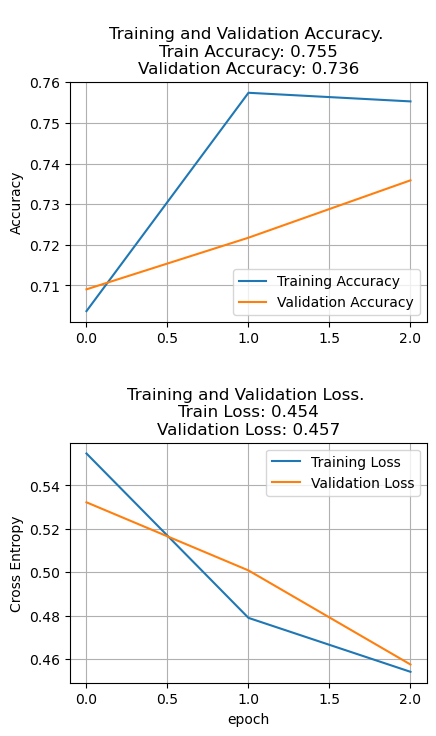

In [ ]:
plot_history(history)

In [ ]:
# Unfreeze the base_model
nr_base_layers = len(inception_base_model.layers)
print("Inception base layers = ", nr_base_layers)    

history = fit_model(inception_model, inception_base_model, epochs = FINE_TUNING_EPOCHS, fine_tune = int(nr_base_layers/4))

Inception base layers =  780
Unfreezing number of layers in base model =  195
Epoch 1/7
89/89 [==============================] - 107s 809ms/step - loss: 0.4844 - accuracy: 0.7666 - val_loss: 0.4447 - val_accuracy: 0.7387
Epoch 2/7
89/89 [==============================] - 69s 775ms/step - loss: 0.4032 - accuracy: 0.7864 - val_loss: 0.4030 - val_accuracy: 0.7740
Epoch 3/7
89/89 [==============================] - 69s 775ms/step - loss: 0.3745 - accuracy: 0.7896 - val_loss: 0.3760 - val_accuracy: 0.7768
Epoch 4/7
89/89 [==============================] - 69s 777ms/step - loss: 0.3307 - accuracy: 0.8274 - val_loss: 0.3280 - val_accuracy: 0.8362
Epoch 5/7
89/89 [==============================] - 69s 774ms/step - loss: 0.2931 - accuracy: 0.8660 - val_loss: 0.2995 - val_accuracy: 0.8644
Epoch 6/7
89/89 [==============================] - 69s 778ms/step - loss: 0.2515 - accuracy: 0.8876 - val_loss: 0.2761 - val_accuracy: 0.8757
Epoch 7/7
89/89 [==============================] - 69s 774ms/step - l

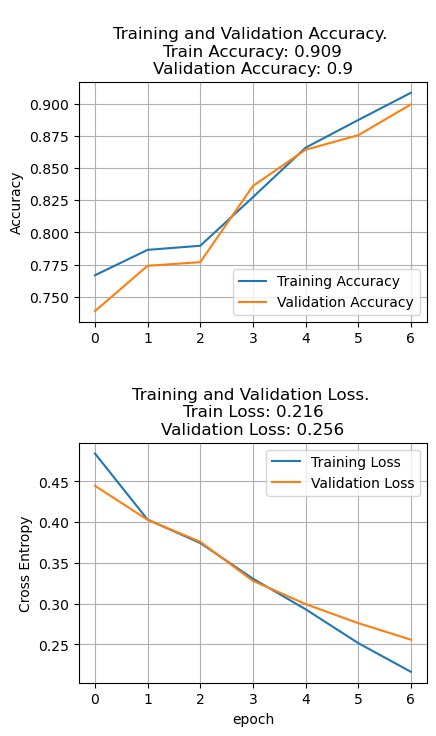

In [ ]:
 plot_history(history)

In [ ]:
accuracy_score = inception_model.evaluate(test_generator)

print(accuracy_score)
print("Accuracy: {:.2f}%".format(accuracy_score[1] * 100))
print("Loss: {:.3f}".format(accuracy_score[0]))

13/13 [==============================] - 5s 386ms/step - loss: 0.3343 - accuracy: 0.8702
[0.33434465527534485, 0.8702290058135986]
Accuracy: 87.02%
Loss: 0.334


In [ ]:
# Perform predictions to allow computation of the confusion matrix later on
# Do not shuffle predictions otherwise we have no way of finding out the true labels
test_generator.reset()
inception_test_preds = inception_model.predict(test_generator)
inception_test_pred_classes = np.argmax(inception_test_preds, axis=1)

13/13 [==============================] - 5s 171ms/step


In [ ]:
fpr_inception, tpr_inception, thresholds_inception = roc_curve(test_generator.classes, inception_test_preds[:,1])
auc_inception = auc(fpr_inception, tpr_inception)

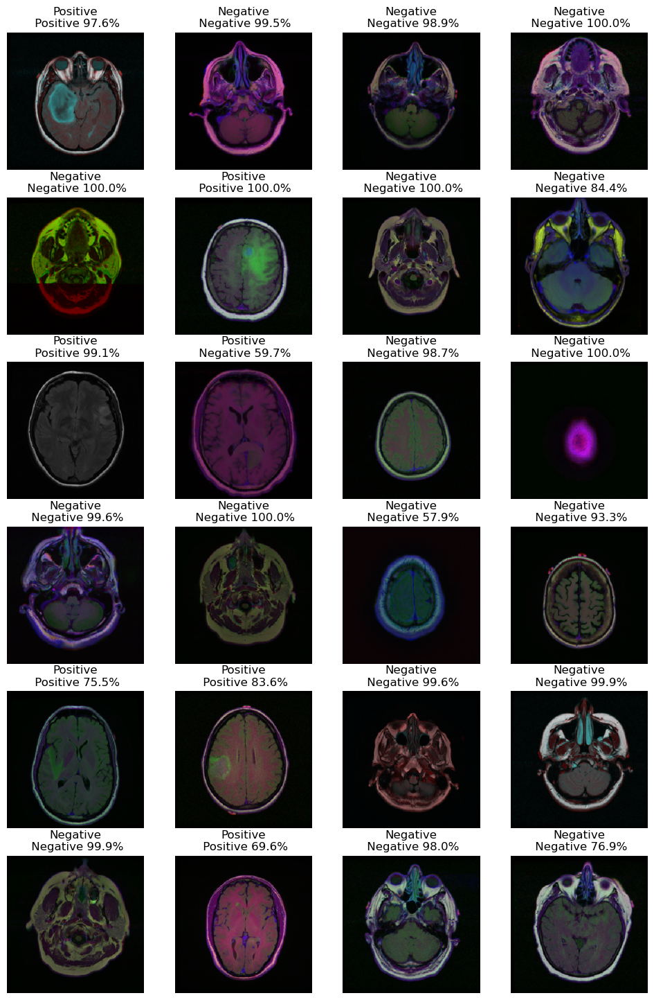

In [ ]:
test_generator.reset()
x, y = next(test_generator)
plot_images(x, y, inception_test_preds)

/tmp/ipykernel_23/546683909.py:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


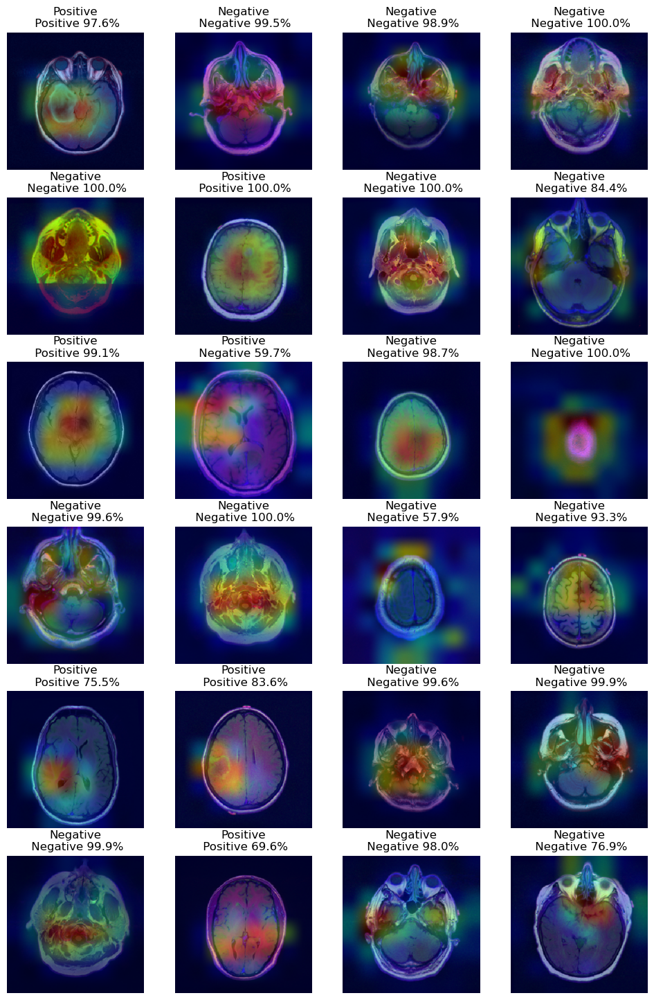

In [ ]:
last_conv_layer_name = "conv_7b_ac"

heatmaps =[]

for img in x:
    heatmap = make_gradcam_heatmap(img, inception_model, last_conv_layer_name)
    heatmaps.append(heatmap)
    
plot_images(heatmaps, y, inception_test_preds)

# VGG16

In [ ]:
# load the VGG16 architecture with imagenet weights as base
vgg16_base_model = tf.keras.applications.vgg16.VGG16(
                             include_top = False,
                             weights = 'imagenet',
                             input_shape = (image_height, image_width, 3)
                             )

# For freezing the layer we make use of layer.trainable = False
# means that its internal state will not change during training.
# model's trainable weights will not be updated during fit(),
# and also its state updates will not run.
vgg16_model = create_model(vgg16_base_model)
#vgg16_model.summary()
history = fit_model(vgg16_model, vgg16_base_model, epochs = TRAINING_EPOCHS)

58889256/58889256 [==============================] - 0s 0us/step
Unfreezing number of layers in base model =  0
Epoch 1/3
89/89 [==============================] - 69s 716ms/step - loss: 0.5634 - accuracy: 0.7069 - val_loss: 0.5604 - val_accuracy: 0.7288
Epoch 2/3
89/89 [==============================] - 64s 719ms/step - loss: 0.4858 - accuracy: 0.7511 - val_loss: 0.5050 - val_accuracy: 0.7288
Epoch 3/3
89/89 [==============================] - 64s 712ms/step - loss: 0.4789 - accuracy: 0.7514 - val_loss: 0.5050 - val_accuracy: 0.7288


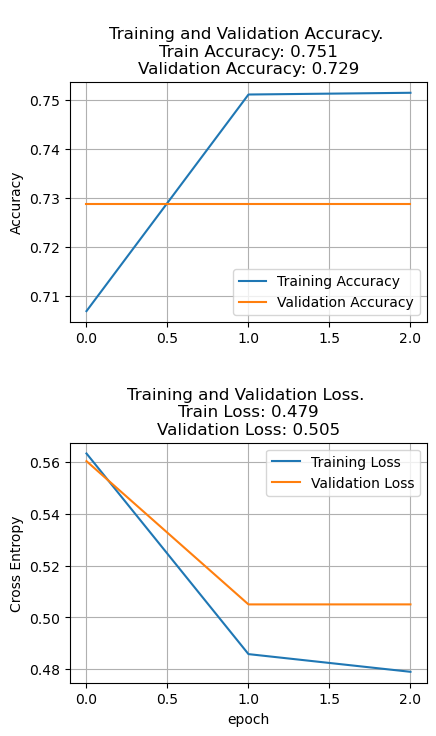

In [ ]:
plot_history(history)

In [ ]:
# Unfreeze the base_model. Note that it keeps running in inference mode
# since we passed `training=False` when calling it. This means that
# the batchnorm layers will not update their batch statistics.
# This prevents the batchnorm layers from undoing all the training
# we've done so far.
nr_base_layers = len(vgg16_base_model.layers)
print("VGG16 base layers = ", nr_base_layers)    

history = fit_model(vgg16_model, vgg16_base_model, epochs = FINE_TUNING_EPOCHS, fine_tune = int(nr_base_layers/4))

VGG16 base layers =  19
Unfreezing number of layers in base model =  4
Epoch 1/7
89/89 [==============================] - 67s 712ms/step - loss: 0.4556 - accuracy: 0.7560 - val_loss: 0.5178 - val_accuracy: 0.7147
Epoch 2/7
89/89 [==============================] - 65s 726ms/step - loss: 0.4394 - accuracy: 0.7571 - val_loss: 0.5102 - val_accuracy: 0.7133
Epoch 3/7
89/89 [==============================] - 64s 722ms/step - loss: 0.4241 - accuracy: 0.7645 - val_loss: 0.4647 - val_accuracy: 0.7528
Epoch 4/7
89/89 [==============================] - 64s 720ms/step - loss: 0.4105 - accuracy: 0.7726 - val_loss: 0.4468 - val_accuracy: 0.7514
Epoch 5/7
89/89 [==============================] - 64s 718ms/step - loss: 0.3969 - accuracy: 0.7793 - val_loss: 0.4473 - val_accuracy: 0.7486
Epoch 6/7
89/89 [==============================] - 64s 720ms/step - loss: 0.3718 - accuracy: 0.8030 - val_loss: 0.3945 - val_accuracy: 0.7966
Epoch 7/7
89/89 [==============================] - 64s 721ms/step - loss: 0.3

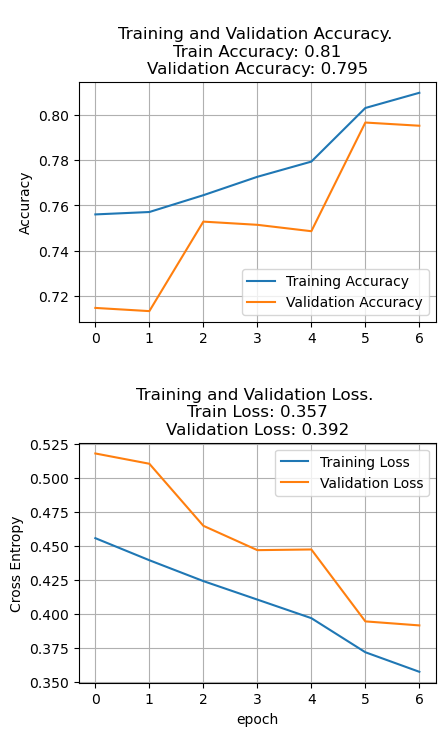

In [ ]:
plot_history(history)

In [ ]:
accuracy_score = vgg16_model.evaluate(test_generator)

print(accuracy_score)
print("Accuracy: {:.2f}%".format(accuracy_score[1] * 100))
print("Loss: {:.3f}".format(accuracy_score[0]))

13/13 [==============================] - 3s 228ms/step - loss: 0.3872 - accuracy: 0.7684
[0.3872128427028656, 0.7684478163719177]
Accuracy: 76.84%
Loss: 0.387


In [ ]:
# Perform predictions to allow computation of the confusion matrix later on
# Do not shuffle predictions otherwise we have no way of finding out the true labels
test_generator.reset()

vgg16_test_preds = vgg16_model.predict(test_generator)
vgg16_test_pred_classes = np.argmax(vgg16_test_preds, axis=1)

13/13 [==============================] - 2s 146ms/step


In [ ]:
fpr_vgg16, tpr_vgg16, thresholds_vgg16 = roc_curve(test_generator.classes, vgg16_test_preds[:,1])
auc_vgg16 = auc(fpr_vgg16, tpr_vgg16)

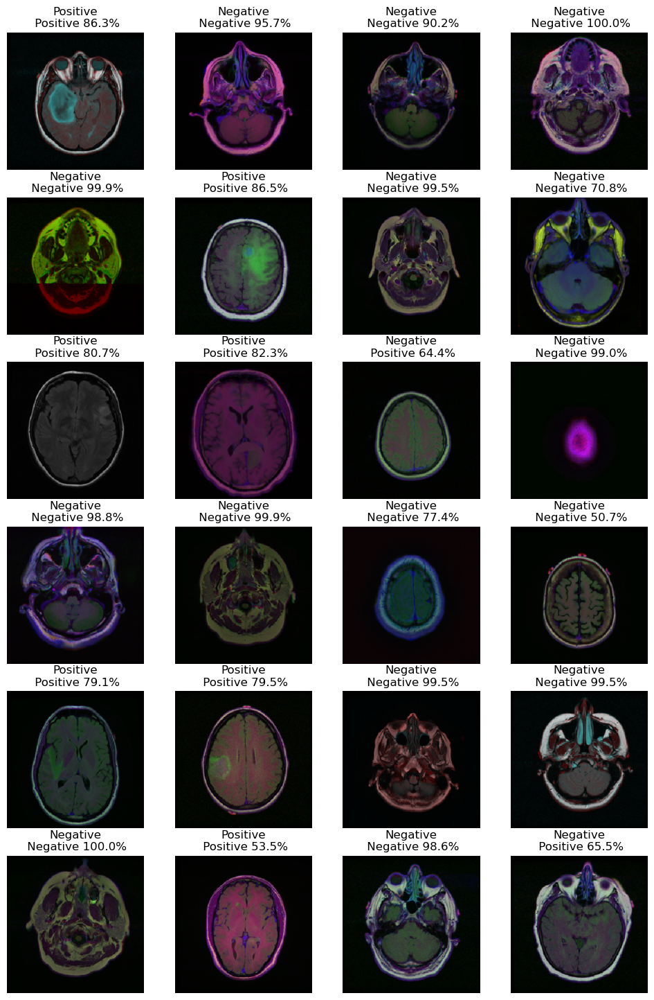

In [ ]:
test_generator.reset()
x,y = next(test_generator)
plot_images(x, y, vgg16_test_preds)

/tmp/ipykernel_23/546683909.py:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


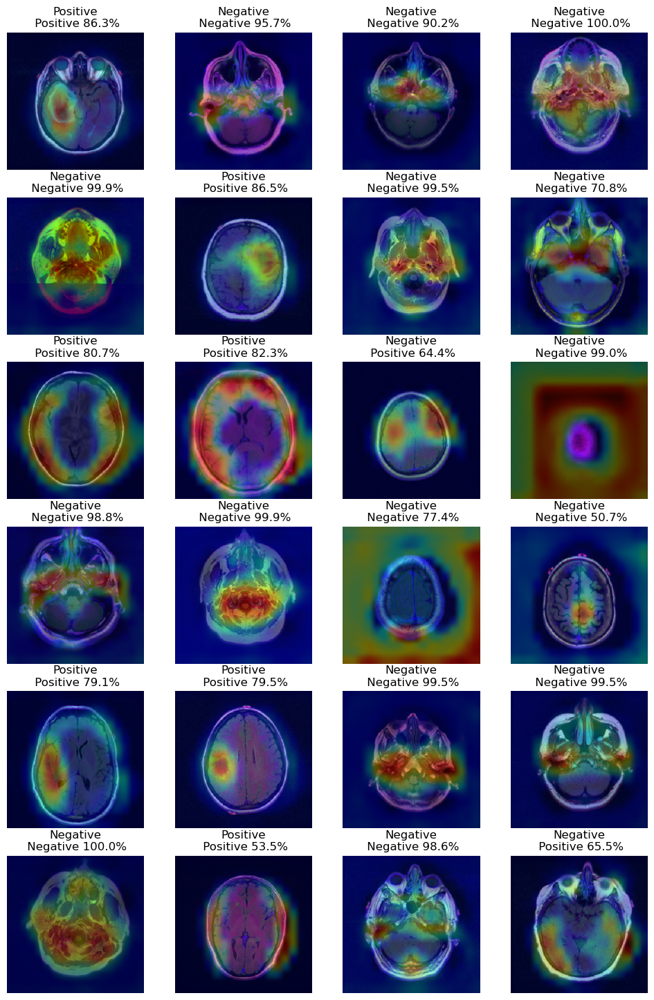

In [ ]:
last_conv_layer_name = "block5_conv3"

heatmaps =[]

for img in x:
    heatmap = make_gradcam_heatmap(img, vgg16_model, last_conv_layer_name)
    heatmaps.append(heatmap)
    
plot_images(heatmaps, y, vgg16_test_preds)

# Xception

In [ ]:
# load the xception architecture with imagenet weights as base
xception_base_model = tf.keras.applications.xception.Xception(
                                 include_top = False,
                                 weights = 'imagenet',
                                 input_shape = (image_height, image_width, 3)
                                 )

# For freezing the layer we make use of layer.trainable = False
# means that its internal state will not change during training.
# model's trainable weights will not be updated during fit(),
# and also its state updates will not run.
xception_model = create_model(xception_base_model)
#xception_model.summary()
history = fit_model(xception_model, xception_base_model, epochs = TRAINING_EPOCHS)

83683744/83683744 [==============================] - 0s 0us/step
Unfreezing number of layers in base model =  0
Epoch 1/3
89/89 [==============================] - 70s 728ms/step - loss: 0.5073 - accuracy: 0.7450 - val_loss: 0.4807 - val_accuracy: 0.7302
Epoch 2/3
89/89 [==============================] - 65s 732ms/step - loss: 0.4304 - accuracy: 0.7716 - val_loss: 0.4223 - val_accuracy: 0.7726
Epoch 3/3
89/89 [==============================] - 64s 717ms/step - loss: 0.4020 - accuracy: 0.7864 - val_loss: 0.4508 - val_accuracy: 0.7373


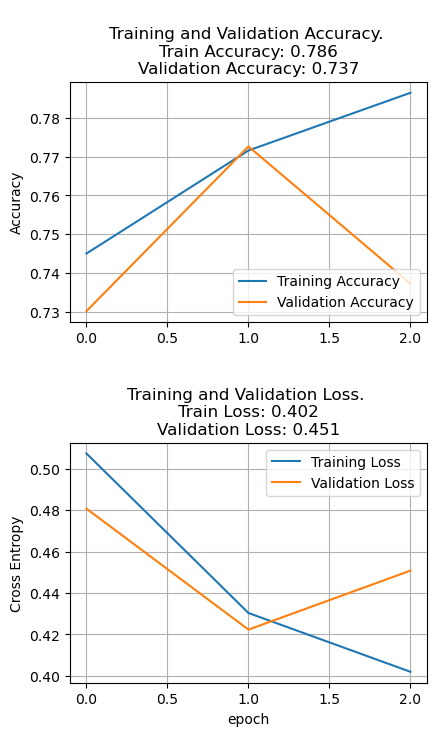

In [ ]:
plot_history(history)

In [ ]:
# Unfreeze the base_model. Note that it keeps running in inference mode
# since we passed `training=False` when calling it. This means that
# the batchnorm layers will not update their batch statistics.
# This prevents the batchnorm layers from undoing all the training
# we've done so far.
nr_base_layers = len(xception_base_model.layers)
print("xception base layers = ", nr_base_layers)    

history = fit_model(xception_model, xception_base_model, epochs = FINE_TUNING_EPOCHS, fine_tune = int(nr_base_layers/4))

xception base layers =  132
Unfreezing number of layers in base model =  33
Epoch 1/7
89/89 [==============================] - 77s 730ms/step - loss: 0.5596 - accuracy: 0.7670 - val_loss: 0.4378 - val_accuracy: 0.7359
Epoch 2/7
89/89 [==============================] - 66s 739ms/step - loss: 0.3888 - accuracy: 0.7938 - val_loss: 0.4192 - val_accuracy: 0.7641
Epoch 3/7
89/89 [==============================] - 67s 752ms/step - loss: 0.3704 - accuracy: 0.8002 - val_loss: 0.3932 - val_accuracy: 0.7726
Epoch 4/7
89/89 [==============================] - 68s 764ms/step - loss: 0.3565 - accuracy: 0.8076 - val_loss: 0.3804 - val_accuracy: 0.7825
Epoch 5/7
89/89 [==============================] - 68s 763ms/step - loss: 0.3300 - accuracy: 0.8204 - val_loss: 0.3711 - val_accuracy: 0.7881
Epoch 6/7
89/89 [==============================] - 67s 749ms/step - loss: 0.3105 - accuracy: 0.8292 - val_loss: 0.3533 - val_accuracy: 0.7952
Epoch 7/7
89/89 [==============================] - 67s 750ms/step - loss

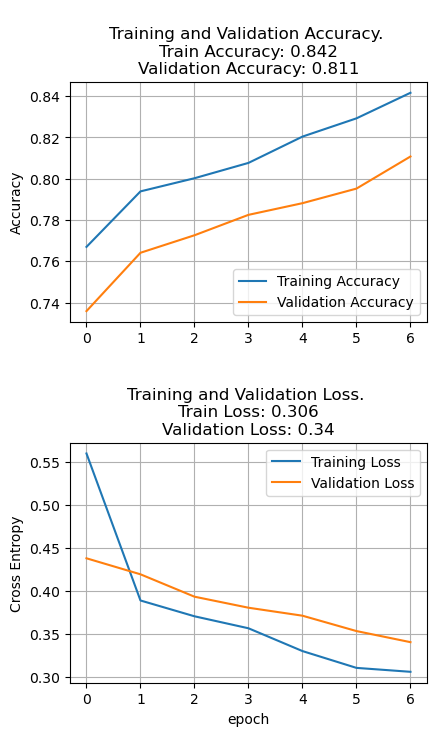

In [ ]:
plot_history(history)

In [ ]:
accuracy_score = xception_model.evaluate(test_generator)

print(accuracy_score)
print("Accuracy: {:.2f}%".format(accuracy_score[1] * 100))
print("Loss: {:.3f}".format(accuracy_score[0]))

13/13 [==============================] - 3s 194ms/step - loss: 0.3391 - accuracy: 0.8219
[0.3391067385673523, 0.821882963180542]
Accuracy: 82.19%
Loss: 0.339


In [ ]:
# Perform predictions to allow computation of the confusion matrix later on
# Do not shuffle predictions otherwise we have no way of finding out the true labels
test_generator.reset()

xception_test_preds = xception_model.predict(test_generator)
xception_test_pred_classes = np.argmax(xception_test_preds, axis = 1)

13/13 [==============================] - 3s 171ms/step


In [ ]:
fpr_xception, tpr_xception, thresholds_xception = roc_curve(test_generator.classes, xception_test_preds[:,1])
auc_xception = auc(fpr_xception, tpr_xception)

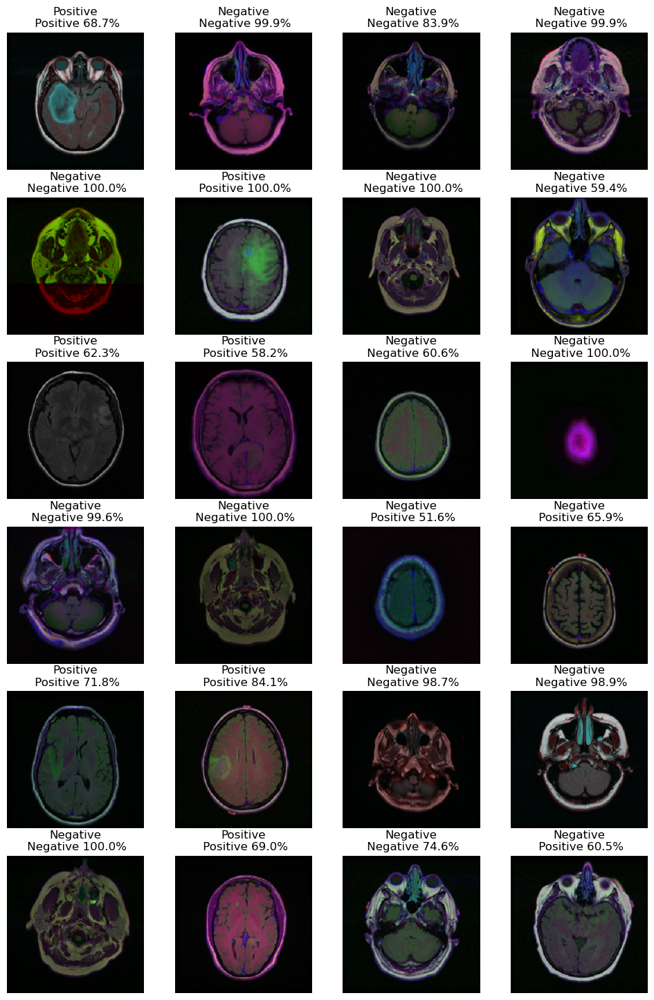

In [ ]:
test_generator.reset()
x, y = next(test_generator)
plot_images(x, y, xception_test_preds)

/tmp/ipykernel_23/546683909.py:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


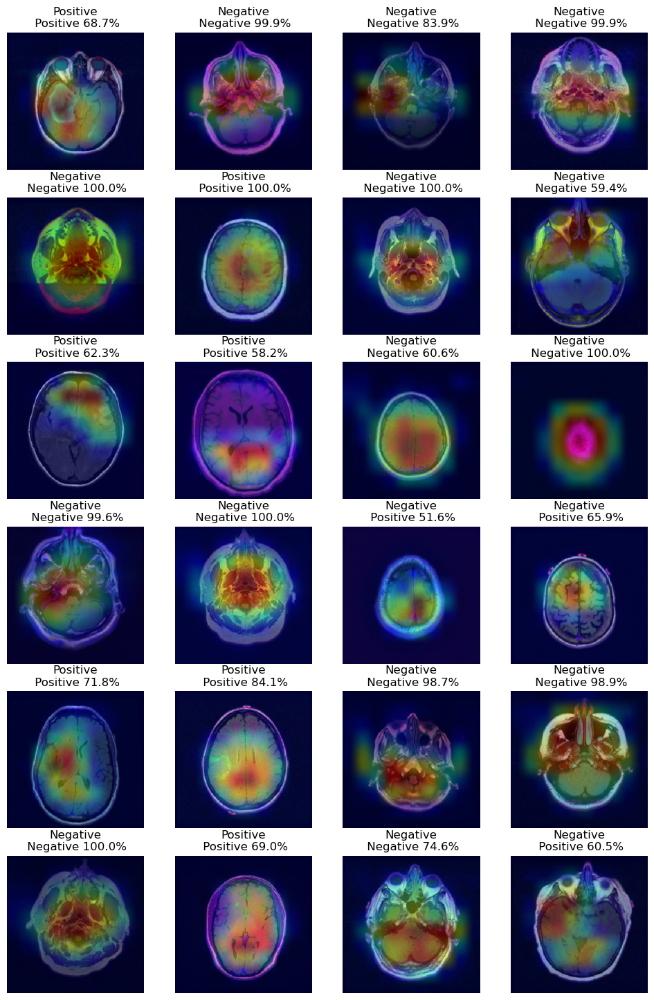

In [ ]:
last_conv_layer_name = "block14_sepconv2_act"

heatmaps = []

for img in x:
    heatmap = make_gradcam_heatmap(img, xception_model, last_conv_layer_name)
    heatmaps.append(heatmap)
    
plot_images(heatmaps, y, xception_test_preds)

# Confusion Matrix

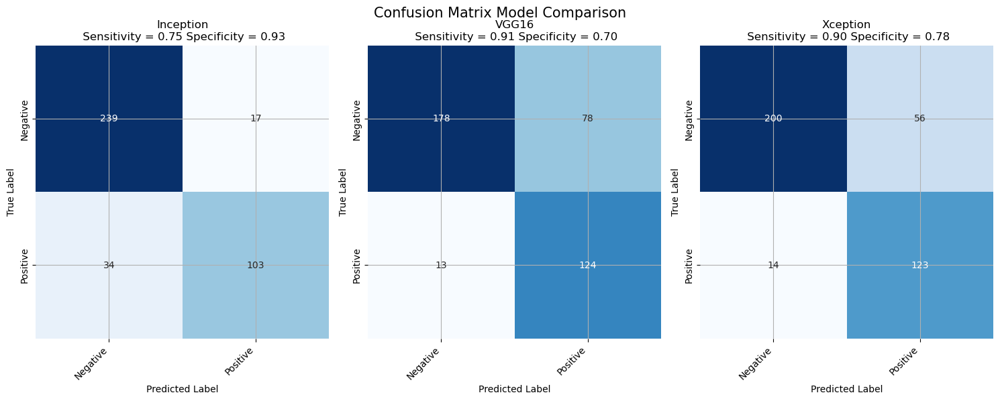

In [ ]:
# Display confusion matrix
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 8))

true_classes = test_generator.classes

plot_heatmap(true_classes, inception_test_pred_classes, class_names, ax1, title = "Inception")    
plot_heatmap(true_classes, vgg16_test_pred_classes, class_names, ax2, title = "VGG16")    
plot_heatmap(true_classes, xception_test_pred_classes, class_names, ax3, title = "Xception")    

fig.suptitle("Confusion Matrix Model Comparison", fontsize = 15)
fig.tight_layout()
fig.subplots_adjust(top=1.25)
plt.show()

# Ensemble

In [ ]:
ensemble_preds = np.add(np.add(inception_test_preds, vgg16_test_preds), xception_test_preds)/3.0

In [ ]:
ensemble_test_pred_classes = np.argmax(ensemble_preds, axis = 1)

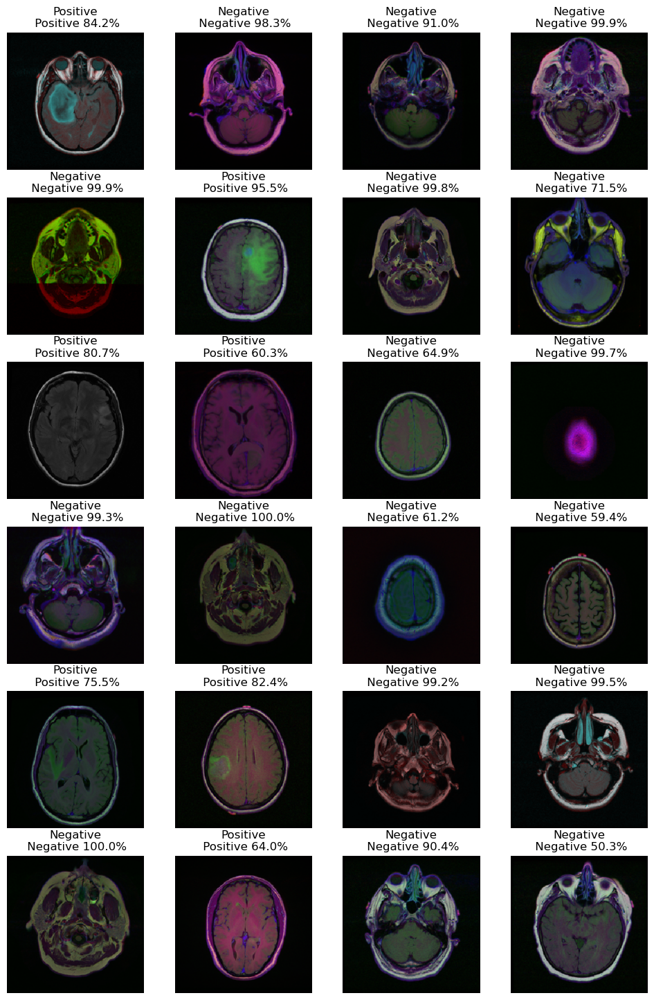

In [ ]:
test_generator.reset()
x, y = next(test_generator)
plot_images(x, y, ensemble_preds)

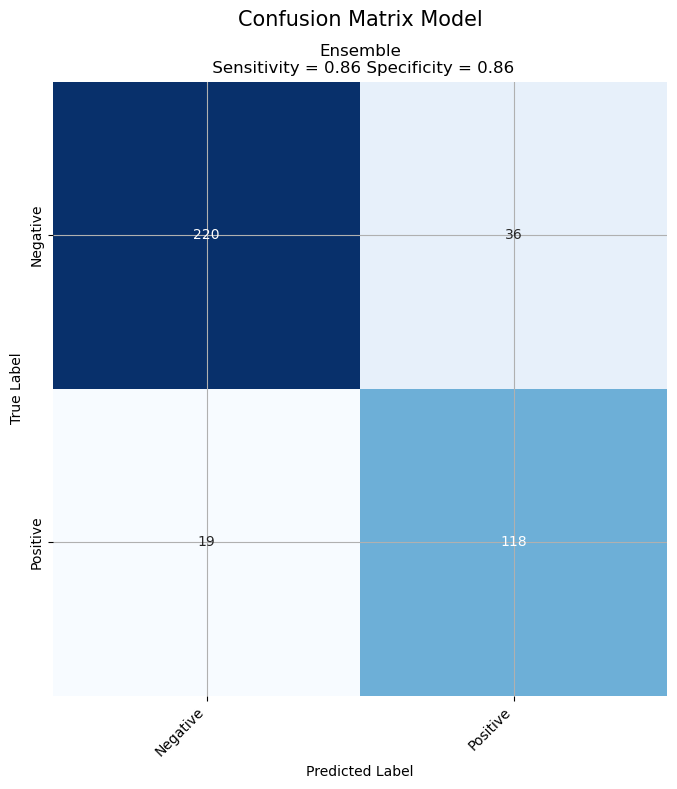

In [ ]:
# Display confusion matrix
fig, (ax1) = plt.subplots(1, 1, figsize=(15, 8))

true_classes = test_generator.classes

plot_heatmap(true_classes, ensemble_test_pred_classes, class_names, ax1, title = "Ensemble")        

fig.suptitle("Confusion Matrix Model", fontsize = 15)
fig.tight_layout()
plt.show()

In [ ]:
fpr_ensemble, tpr_ensemble, thresholds_ensemble = roc_curve(test_generator.classes, ensemble_preds[:,1])
auc_ensemble = auc(fpr_ensemble, tpr_ensemble)

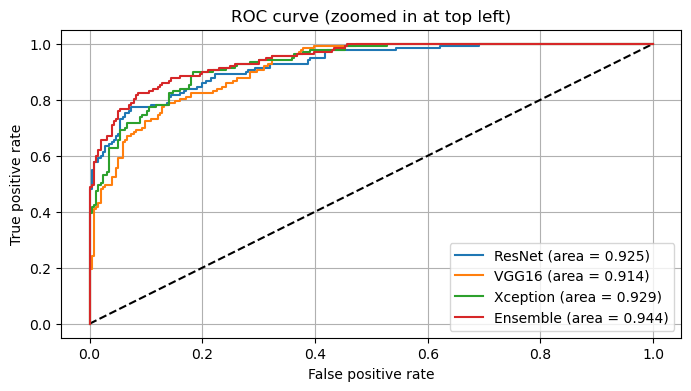

In [ ]:
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr_inception, tpr_inception, label='ResNet (area = {:.3f})'.format(auc_inception))
plt.plot(fpr_vgg16, tpr_vgg16, label='VGG16 (area = {:.3f})'.format(auc_vgg16))
plt.plot(fpr_xception, tpr_xception, label='Xception (area = {:.3f})'.format(auc_xception))
plt.plot(fpr_ensemble, tpr_ensemble, label='Ensemble (area = {:.3f})'.format(auc_ensemble))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve (zoomed in at top left)')
plt.legend(loc='best')
plt.show()